# Project 2: Laplacian pyramid blending &amp; hybrid images

## 1. Background

Written by Quentin Adolphe (qadolphe1@swarthmore.edu) and Cole Smith for our Swarthmore College Computer Vision course in 2023.

Taught by Visiting Assistant Professor of Engineering at Swarthmore College, Stephen Philips.
Coursework adapted from Matt Zucker, associate professor in the Engineering department at Swarthmore College.

All code in "Your Code" section completed by Quentin Adolphe and Cole Smith. Project description written by Matt Zucker and Stephen Philips

In this project, we will investigate two applications:
*Laplacian pyramid blending* and *hybrid images*.  You can
use the former to make smooth transitions between arbitrary images,
such as the apple/orange blend depicted here:


<!-- <p align="center">
  <img src="description-images/apple_orange.jpg" width="30%" />
</p>
 -->

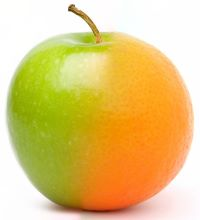

The hallmark of the Laplacian pyramid blend is that low-frequency
features (like the constant green or orange hues of the fruits) are
blended over larger distances than high-frequency features (such as
the tiny dots on the apple or the dimples on the orange).

Hybrid images are interesting optical illusions described in
the section below.

Knowing how image features are distributed across the frequency
spectrum is critical for understanding both of these applications.

### 1.1 Laplacian operator

Similar to the gradient, the *Laplacian operator* is a derivative of a
scalar function such as a grayscale image. Whereas the gradient is a
first derivative that maps an image to a vector at each point, the
Laplacian is a second derivative that maps an image to a scalar at
each point.

The definition of the Laplacian of a function $f: \mathbb{R}^2 \mapsto \mathbb{R}$ is given by
$$
\nabla^2 f = \frac{\partial^2 f}{\partial x^2} + \frac{\partial^2 f}{\partial y^2}.
$$
That is, the Laplacian is the sum of second partial derivatives of the image.

Just as the partial derivative of a blurred image can be computed by
filtering with the derivative of a Gaussian, the Laplacian of a
blurred image can be computed by filtering with the Laplacian of a
Gaussian (LoG) filter, defined as the Laplacian of the Gaussian
kernel.

Here is the LoG kernel in 1D and 2D:




<!-- <p align="center">
  <img src="description-images/LoG.png" width="50%" />
</p> -->
  
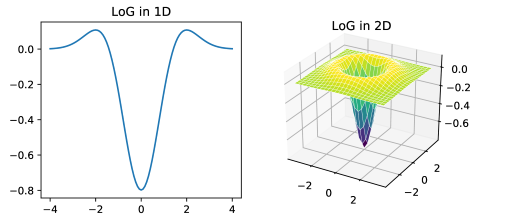

As it turns out, the LoG filter can be well-approximated by a
difference of Gaussians (DoG).  On the left below are two Gaussians
$g_1$ and $g_2$ whose widths are given by $\sigma_1$ and $\sigma_2 = 2
\sigma_1$; on the right is a similarly-scaled LoG filter.



<!-- <p align="center">
  <img src="description-images/DoG.png" width="50%" />
</p> -->

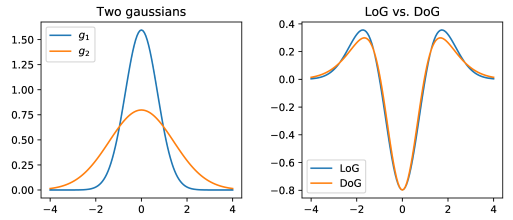


As you can see, the difference $g_2 - g_1$ closely approximates the
LoG kernel (and the same holds for 2D Gaussians/LoG kernels as well).

Hence, by linearity of filtering, taking the difference of two blurs of the same image
is approximately the same as filtering with the LoG:
\[
(I * g_2) - (I * g_1) = I * (g_2 - g_1) \approx I * LoG.
\]
The equation above forms the basis of the so-called *Laplacian
  pyramid* (see section 3.5.3 of the Szeliski textbook), which encodes
an image as a succession of progressively smaller Laplacian-filtered images.
The coarsest layer of the image consists of a blurred and reduced copy of the original image.

### 1.2 Alpha blending


An *alpha mask* is a special type of single-channel image where every pixel
represents a coefficient for a weighted average of two RGB input images.

In the grid below, the top row represents two input RGB images.  The
bottom-left image is a continous mask where 0 corresponds to pixels
from the left input, 1 corresponds to pixels from the right image, and
any value in between corresponds to some combination of the respective
pixels from each image.  The bottom-right image is the *alpha blend* result.


<!-- <p align="center">
  <img src="description-images/apple_orange_alpha_blending.png" width="60%" />
</p> -->

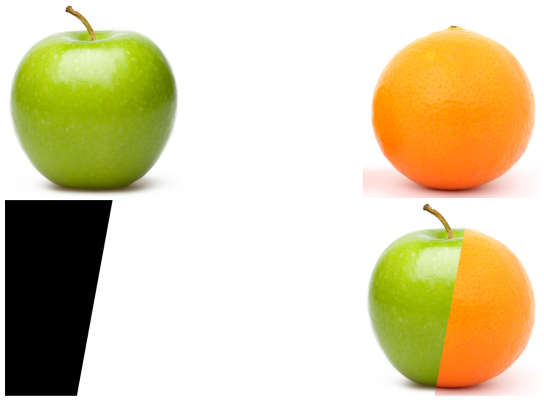


Assuming a floating-point mask, code for an alpha blend might look
something like this:

~~~ Python
for y in range(height):
  for x in range(width):
    for channel in range(3):
       result[y,x,c] = img1[y,x,c] * (1.0 - mask[y,x]) + img2[y,x,c] * mask[y,x]
~~~

This algorithm is implemented much more efficiently as `alpha_blend` (defined in the "Utility functions" section).

The main advantage of alpha blending over strictly boolean masks is
that you can achieve smoother transitions between regions by combining
image pixels continuously.

See <https://en.wikipedia.org/wiki/Alpha_compositing> or Szeliski
section 3.1.3 for more details.

## 2. Laplacian pyramid blending

The Laplacian pyramid is a useful data structure for understanding
images at multiple scales.  Here is a Laplacian pyramid of a cat
(source image at [`blep.jpg`](https://drive.google.com/file/d/1wh4_jfyFd3IcDOj4j_D0kByPEZXgMeEU/view?usp=share_link)):

  
 


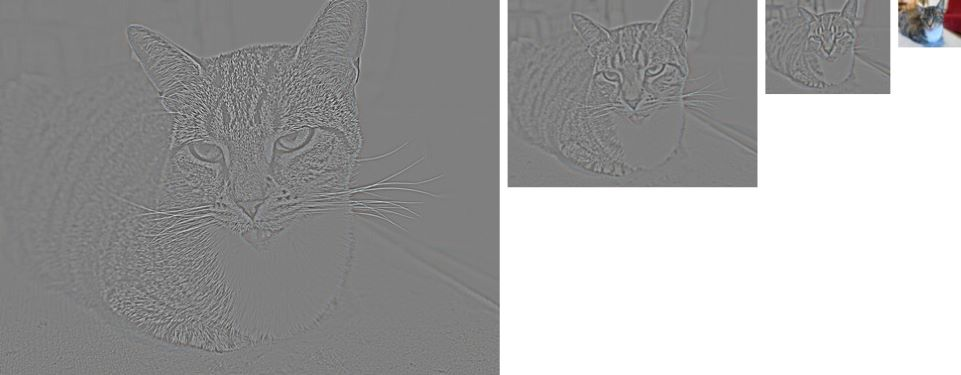

As you can see, the images are decreasing in size, and all but
the smallest/coarsest are derivative images (i.e. their intensity
values can be either positive or negative, with middle gray
representing zero intensity).


#### Alpha Blending
<!-- <p align="center"><img src="description-images/example1a.jpg" width="35%" /></p> -->
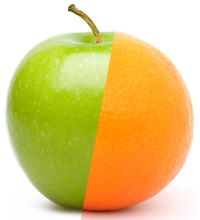

#### Laplacian Blending
<!-- <p align="center"><img src="description-images/example1l.jpg" width="35%" /></p> -->
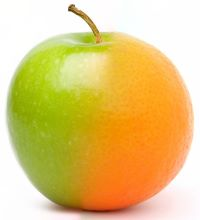
  

## 3. Hybrid images

The image below is an example of an interesting optical illusion (shown in two sizes).




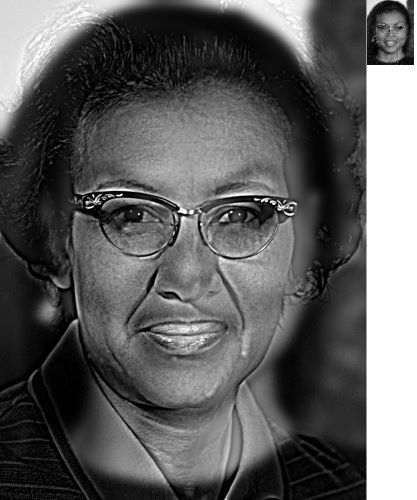


When viewed close up, it appears to be
NASA mathematician Katherine Johnson. However if you view it from far
away (or use your browser's "zoom out" functionality to shrink it), it
begins to resemble actor Taraji P. Henson, who portrayed Johnson in
the film *Hidden Figures*.

Such a *hybrid image* can be obtained from two source images $A$
and $B$ by following these steps:

 * Obtain $A_{lopass} = g(A, \sigma_A)$ by blurring $A$ with a Gaussian
   kernel with width $\sigma_A$.
   
 * Obtain $B_{hipass} = B - g(B, \sigma_B)$ by blurring $B$ with a Gaussian kernel of width
   $\sigma_B$, and subtracting the result from $B$.
   
 * The resulting image is obtained as $I = A_{lopass} + k \, B_{hipass}$.
 
One important caveat is that hybrid images only work well if the two
input images $A$ and $B$ are well-aligned in the first place! You
simply won't get a good result if you try to make a hybrid image of a
skyscraper and a hot air balloon. I've also found that black-and-white 
images tend to work better than color but both can work fine if you 
choose your inputs carefully.

# Code

Our code used for the project is attached below with a process explanation in the Write Up:

In [18]:
import os
import sys
from collections import namedtuple
import json

import cv2
import numpy as np
import matplotlib.pyplot as plt

MAX_DISPLAY_W = 1200 
MAX_DISPLAY_H = 700

FIRST_IMSHOW = True

## Utility Functions

In [19]:

############################################################################################
# Image manipulation functions

######################################################################
def draw_image_with_mask(image, mask):
    """Return a copy of image with the mask overlaid for display."""
    assert image.shape[:2] == mask.shape
    return alpha_blend(image // 2, image // 2 + 128, mask)


######################################################################
def alpha_blend(img1, img2, mask):
    """Perform alpha blend of img1 and img2 using mask.

    Result is an image of same shape as img1 and img2.  Wherever mask
    is 0, result pixel is same as img1. Wherever mask is 255 (or 1.0
    for float mask), result pixel is same as img2. For values in between,
    mask acts as a weight for a weighted average of img1 and img2.

    See https://en.wikipedia.org/wiki/Alpha_compositing
    """

    (h, w) = img1.shape[:2]

    assert img2.shape == img1.shape
    assert mask.shape == img1.shape or mask.shape == (h, w)

    result = np.empty_like(img1)

    if mask.dtype == np.uint8:
        mask = mask.astype(np.float32) / 255.0

    if len(mask.shape) == 2 and len(img1.shape) == 3:
        mask = mask[:, :, None]

    result[:] = img1 * (1 - mask) + img2 * mask

    return result


############################################################################################
# Functions for creating ROIs

######################################################################
def ellipse_mask_from_roi(src_image, src_roi, wh_scales=(1.0, 1.0), flip=False):
    src = src_roi
    wsz, hsz = wh_scales

    h, w = src_image.shape[:2]
    src_size = (w, h)

    ellipse_mask = roi_draw_ellipse(src, wsz, hsz, src_size)
    return ellipse_mask

######################################################################

def roi_from_points(top_left, top_right, bottom):
    """Create an ImageROI struct from three points given by user.
    Returns a namedtuple with fields: 

      * center:         center of ROI rectangle as (float, float) tuple
      * angle:          angle of ROI rectangle in radians
      * width:          width of ROI rectangle
      * height:         height of ROI rectangle, also used as 
                        scaling factor for warps
    """
    p0 = np.array(top_left, dtype=np.float32)
    p1 = np.array(top_right, dtype=np.float32)
    p2 = np.array(bottom)

    u = p1-p0
    width = np.linalg.norm(u)
    u /= width
    v = p2-p0

    if u[0] * v[1] - u[1] * v[0] < 0:
        u = -u
        top_left, top_right = top_right, top_left

    v -= u * np.dot(u, v) 

    assert np.abs(np.dot(u, v)) < 1e-4
    height = np.linalg.norm(v)

    cx, cy = p0 + 0.5*u*width + 0.5*v
    angle = np.arctan2(u[1], u[0])

    return ImageROI((float(cx), float(cy)), 
                     float(angle), float(width), float(height))



############################################################################################
# Region of interest handlers

######################################################################
ImageROI = namedtuple(
    'ImageROI', 
    ['center', 'angle', 'width', 'height']
) # Region of Interest container object


######################################################################
def roi_from_center_angle_dims(center, angle, width, height):
    """Simple ROI constructor from center, angle, width, height."""
    center = (float(center[0]), float(center[1]))
    angle = float(angle)
    width = float(width)
    height = float(height)

    return ImageROI(center, angle, width, height)


######################################################################
def roi_get_matrix(image_roi):
    """Get a 3x3 matrix mapping local object points (x, y) in the ROI to
    image points (u, v) according to the formulas:

       x' = image_roi.height * x
       y' = image_roi.height * y

       c  = cos(image_roi.angle)
       s  = sin(image_roi.angle)

       u  = c * x' - s * y' + image_roi.center[0]
       v  = s * x' + c * y' + image_roi.center[1]

    """
    c = np.cos(image_roi.angle)
    s = np.sin(image_roi.angle)
    tx, ty = image_roi.center
    h = image_roi.height
    return np.array([[c*h, -s*h, tx],
                     [s*h, c*h, ty],
                     [0, 0, 1]])


######################################################################

def roi_map_points(image_roi, opoints):
    """Map from local object points to image points using the matrix
    established by roi_get_matrix(). The opoints parameter should be an
    n-by-2 array of (x, y) object points. The return value is an
    n-by-2 array of (u, v) pixel locations in the image.

    """
    M = roi_get_matrix(image_roi)
    opoints = opoints.reshape(-1, 1, 2)
    ipoints = cv2.perspectiveTransform(opoints, M)
    return ipoints.reshape(-1, 2)

######################################################################
def draw_roi_on_image(image, image_roi, color=(255, 255, 0), thickness=10):
    """Draws ROI box on image, accounting for angle. Takes in optional color and thickness."""
    opoints = np.array([
        [-0.5, -0.5],
        [ 0.5, -0.5],
        [ 0.5,  0.5],
        [-0.5,  0.5],
        [-0.2,  0.0],
        [ 0.2,  0.0],
        [ 0.0, -0.2],
        [ 0.0,  0.2],
        [ 0.0,  0.5]
    ]) * np.array([image_roi.width/image_roi.height, 1])

    ipoints = roi_map_points(image_roi, opoints).astype(int)

    display = image.copy()
    scl = thickness

    cv2.polylines(display, [ipoints[:4]], True, 
                  color, scl, cv2.LINE_AA)


    for i in [0, 1, -1]:
        cv2.circle(display, tuple(ipoints[i]), 4*scl, 
                   color, scl, cv2.LINE_AA)

    cv2.line(display, tuple(ipoints[4]), tuple(ipoints[5]), 
             color, scl, cv2.LINE_AA)

    cv2.line(display, tuple(ipoints[6]), tuple(ipoints[7]), 
             color, scl, cv2.LINE_AA)

    return display


######################################################################
def roi_draw_ellipse(img_roi, wsz, hsz, size=None): 
    """Draw an ellipse into an 8-bit single-channel mask image centered
    on the given ROI and rotated to align with it. The given dimensions
    are as fractions of the total height of the original ROI.
    """
    w, h = size

    mask = np.zeros((h, w), dtype=np.uint8)
    
    axes = 0.5 * img_roi.height * np.array([wsz, hsz])

    center = tuple([int(x) for x in img_roi.center])
    axes = tuple([int(x) for x in axes])

    deg = 180/np.pi

    return cv2.ellipse(mask, center, axes,
                       img_roi.angle*deg, 0, 360,
                       (255, 255, 255), -1, cv2.LINE_AA)


######################################################################
def roi_warp(src_image, src_roi, dst_roi, dst_size=None, flip=False):

    """Warps the src_image so that its ROI overlaps the corresponding ROI
    in the destination image. Image scaling is based on height.
    """

    if src_image is None:
        src_image = cv2.imread(src_roi.image_filename)

    if dst_size is None:
        dst_image = cv2.imread(dst_roi.image_filename)
        h, w = dst_image.shape[:2]
        dst_size = (w, h)

    src_mat = roi_get_matrix(src_roi)
    dst_mat = roi_get_matrix(dst_roi)

    if flip:
        flip = np.diag([-1, 1, 1])
    else:
        flip = np.eye(3)

    M = dst_mat @ flip @ np.linalg.inv(src_mat) 

    return cv2.warpAffine(src_image, M[:2], dst_size, 
                          flags=cv2.INTER_LINEAR, 
                          borderMode=cv2.BORDER_REFLECT_101)


############################################################################################
# Crop/Warp functions for ROIs

######################################################################
def crop_function(src_image, src_roi, result_height, wh_scales=(1.0, 1.0), scroll_xy=(0, 0), flip=False):
    """Crop function -- takes in image and region of interest
    Inputs:
        src_image: np.array of the image to crop (grayscale or color)
        src_roi: ImageROI object specifying part of image to crop
        result_height: integer, specifying output height
        wh_scales: 2-tuple of floats, specifying how much to expand ROI in w, h direction (respectively)
        scroll_xy: 2-tuple of integers, specifying how much to offset the ROI in x, y direction (respectively)
        flip: boolean, specifying weather or not to flip the image in the x direction
    Returns:
        result_image: Resulting cropped image
        dst_roi: ROI that was modified by wh_scales, scroll_xy
    """

    wsz, hsz = wh_scales
    scroll_x, scroll_y = scroll_xy
    
    wpx = wsz * src_roi.height
    hpx = hsz * src_roi.height

    result_width = int(round(result_height * wpx / hpx))

    scl = result_height / (src_roi.height * hsz)

    dst_roi = roi_from_center_angle_dims((0.5*result_width + scroll_x, 0.5*result_height + scroll_y),
                                         0.0,
                                         src_roi.width * scl,
                                         src_roi.height * scl)

    dst_size = (result_width, result_height)

    result_image = roi_warp(src_image, src_roi, dst_roi, dst_size, flip)
    return result_image, dst_roi


######################################################################
def warp_helper_function(src_img, dst_img, src_roi, dst_roi, flip=False):
    """Warp function -- maps ROI from one image onto another.
    Inputs:
        src_img: np.array of the image to warp ROI from
        dst_img: np.array of image to warp ROI to
        src_roi: ImageROI of warp ROI from
        dst_roi: ImageROI of warp ROI to
        flip: boolean, specifying weather or not to flip the image in the x direction
    """
    h, w = dst_img.shape[:2]
    warped = roi_warp(src_img, src_roi, dst_roi, dst_size=(w, h), flip=flip)
    dst_roi = roi_from_center_angle_dims(dst_roi.center,
                                         dst_roi.angle,
                                         src_roi.width * dst_roi.height / src_roi.height,
                                         dst_roi.height)
    return warped, dst_roi



######################################################################
def overlay_display(image1, image2, n_images=6):
    if np.any(image1.shape != image2.shape):
        raise ValueError("image1 and image2 need to be same size but got: {} and {}".format(image1.shape, image2.shape))
    if n_images < 2:
        raise ValueError("n_images needs to be >= 2 but got: {}".format(n_images))
    blend = np.empty_like(image1)
    t = 0.0

    fig, ax = plt.subplots(1, n_images, figsize=(5*n_images, 5))
    fig.suptitle('Overlay', fontsize=14)
    for i in range(n_images):
        # t = (np.pi*i)/(n_images-1)
        # u = np.cos(t) * 0.5 + 0.5 # Alternative interpolation
        u = (1.0*i)/(n_images-1)
        blend[:] = image1*(1.0 - u) + image2*u
        if len(blend.shape) == 2 or (len(blend.shape) == 3 and blend.shape[-1] == 1):
            ax[i].imshow(blend, cmap='gray')
        else:
            ax[i].imshow(blend)



############################################################################################
# Laplacian Visualization

######################################################################
def visualize_pyramid(lp, padding=8):
    """Utility function to display a Laplacian pyramid."""

    n = len(lp)-1
    outputs = []

    h, w = lp[0].shape[:2]

    hmax = max([li.shape[0] for li in lp])

    hstackme = []

    hpadding = np.full((hmax, padding, 3), 255, np.uint8)

    for i, li in enumerate(lp):

        assert li.dtype == np.float32

        if i == n:
            display = li
        else:
            display = 127 + li

        display = np.clip(display, 0, 255).astype(np.uint8)

        h, w = display.shape[:2]

        if h < hmax:
            vpadding = np.full((hmax - h, w, 3), 255, np.uint8)
            display = np.vstack((display, vpadding))


        if i > 0:
            hstackme.append(hpadding)

        hstackme.append(display)

    return np.hstack(tuple(hstackme))





## Your Code

In [20]:
import gdown

# Images go here. To add new images for analysis, get the proper ID from the google drive link
# and update accordingly with the correct name.
id_name_pairs = [ 
    ("1eMrZ6Wyvj44xGOmgGxFlFkqzrwtoTEzf", "blep.jpg"),
    ("1ghyZmmqvBcUEfecqxSVQpDjCb_K7CPrK", "before.jpg"),
    ("1La7pEZbQ0ArUfhQLFCEiAGRmDP2K3XPU", "after.jpg"),
    ("1x4vmGYqHMLq7b5wRjD5p23I1blcQ0qQH", "B.jpg"),
    ("1ZWO-SA7KsSsMFhjyHLmV8LaR5vf_W1_n", "A.jpg"),
    ("1Hm5vzI-smKMRsF0s76Ci9IeDQOFOUfma", "split_mask_example4.png"),
    ("1-pBcxJefdLcTKaa2f8bsohNDX3JY89wW", "samuel.jpg"),
    ("1-sygWNuLK1Vj4BO7S3eLcYcrWsItaXk3", "obama.jpg"),
    ("1TFUW5wHZJPph6vXVcYO5n2bRG-vIxZKB", "split_mask.png"),
    ("1w1LublyvmMke2TMOfp1YucW7u-fFM5L9", "cat.jpg"),
    ("1fyDBJhJq7eFLYLdwe6w-w0gEX2sKgRoO", "wolfrun.jpg"),
    ("1lg429B54l-iVO6c5noQocTId05ZY9wht", "dogrun.jpg")
] 
for id, name, in id_name_pairs:
  url = f'https://drive.google.com/uc?id={id}'
  gdown.download(url, name, quiet=True)

In [21]:
# Function for laplacian blending
def laplacian_blend(img1, img2, mask):
    """Create laplacian blend of img1 and img2, with mask blending them."""
    # TODO: 
    lpA = pyr_build(img1)
    lpB = pyr_build(img2)
    lpI = []

    masks = []

    #alpha blend
    for i in range(len(lpA)):
        (h, w) = lpA[i].shape[:2]
        masks.append(cv2.resize(mask, (w, h), interpolation=cv2.INTER_AREA))
        lpI.append(alpha_blend(lpA[i], lpB[i], masks[-1]))

    result = pyr_reconstruct(lpI)
    return result

# Function for creating a laplacian pyramid
def pyr_build(img):
    G = [img]
    Gu = []
    L = []
    
    while True:
      (h, w) = G[-1].shape[:2]
      G.append(cv2.pyrDown(G[-1]))
      Gu.append(cv2.pyrUp(G[-1], dstsize = (w,h)))

      if (h < 16 and w < 16):
          L.append(G[-2].astype(np.float32))
          break
      else:
          L.append(G[-2].astype(np.float32) - Gu[-1].astype(np.float32))
    return L

# Function for pyramid reconstuction/blending
def pyr_reconstruct(L):
    r = [None] * len(L)
    r[-1] = L[-1]


    for i in range(1,len(L)):
      (h,w) = L[-i-1].shape[:2]
      r[-i-1] = cv2.pyrUp(r[-i], dstsize = (w,h)) + L[-i-1]
      r[-i-1] = np.clip(r[-i-1], 0, 255).astype(np.uint8)

    return r[0]



In [22]:
# Function to create our hybrid image
def hybrid_image(img1, img2, sigmaA, sigmaB, k):
    
    """Create hybrid image of img1 and img2 using filter with parameters sigma and k (described above)"""

    #sigmaA should be 2*sigmaB

    A = img1.astype(np.float32) 
    B = img2.astype(np.float32) 

    aL = cv2.GaussianBlur(A,(sigmaA,sigmaA),0)
    bH = B - cv2.GaussianBlur(B,(sigmaB,sigmaB),0)

    result = aL + bH * k
    result = np.clip(result, 0, 255).astype(np.uint8)

    return result 

In [23]:
# resize any two images to be equal in width and height
def imresize(img1, img2):
  ha,wa = img1.shape[:2]
  hb,wb = img1.shape[:2]

  width = min(wa,wb)
  height = min(ha,hb)

  result1 = cv2.resize(img1, (width,height), interpolation=cv2.INTER_AREA)
  result2 = cv2.resize(img2, (width,height), interpolation=cv2.INTER_AREA)

  return [result1, result2]


### from https://towardsdatascience.com/face-detection-in-2-minutes-using-opencv-python-90f89d7c0f81
# Crop an image to a face
def facecrop(img1, img2):
    # Load the cascade
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    # Convert into grayscale
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    # Detect faces
    face1 = face_cascade.detectMultiScale(gray1, 1.1, 4)
    face2 = face_cascade.detectMultiScale(gray2, 1.1, 4)
    
    (x,y,w,h) = face1[0]

    crop1 = gray1[y:y+h, x:x+w]

    (x,y,w,h) = face2[0]

    crop2 = gray2[y:y+h, x:x+w]

    return crop1, crop2

## Laplacian Pyramid Blending

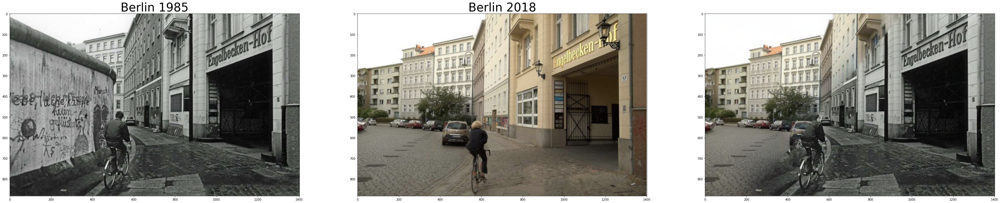

In [24]:
### image1 and image2 for the two images you wish to blend
### as well as the mask to blend them with as a png file.
image1 = "A.jpg"
mask_fname = "split_mask_example4.png"
image2 = "B.jpg"
###############################################################################

image1 = cv2.cvtColor(cv2.imread(image1), cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(cv2.imread(image2), cv2.COLOR_BGR2RGB)


image1, image2 = imresize(image1, image2)

mask = cv2.cvtColor(cv2.imread(mask_fname), cv2.COLOR_BGR2RGB)

berlinBlend = laplacian_blend(image1,image2,mask)


fig, ax = plt.subplots(1,3,figsize=(60, 30))
ax[0].imshow(image2)
ax[0].set_title('Berlin 1985',fontsize = 40)
ax[1].imshow(image1)
ax[1].set_title('Berlin 2018',fontsize = 40)
ax[2].imshow(berlinBlend)



## Hybrid Image

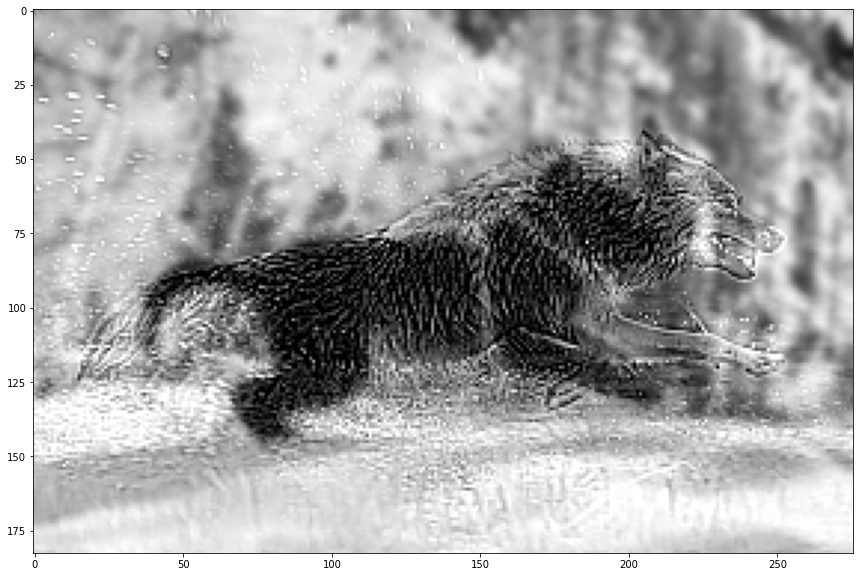

In [25]:

### Choose new images to create a hybrid image of.
ima = "dogrun.jpg"
imb = "wolfrun.jpg"
################################################

ima = cv2.cvtColor(cv2.imread(ima), cv2.COLOR_BGR2RGB)
imb = cv2.cvtColor(cv2.imread(imb), cv2.COLOR_BGR2RGB)


ima, imb = imresize(ima, imb)

wolfDog = hybrid_image(ima, imb,7, 3, 3.0)
fig, ax = plt.subplots(figsize=(40, 10))
ax.imshow(wolfDog)

## Picture URLs: 

Berlin Biker/glacer: https://www.demilked.com/then-and-now-photos-rephotography/

Grayscale Dog: https://welovedoodles.com/web-stories/large-hypoallergenic-dogs/ 

Grayscale Wolf: https://www.icanvas.com/canvas-print/gray-wolf-running-through-water-native-to-north-america-tfi1616#1PC6-26x18  

Pres. Barack Obama: https://www.britannica.com/biography/Barack-Obama

Samuel L. Jackson: https://www.biography.com/actors/samuel-l-jackson



# Write Up

## Background

For our project we decided to do a laplacian pyramid blend to show change over time, and create a hybrid image of two grayscale images of a cat and a dog. For the laplacian pyramid blend we found a website with a variety of images depicting locations over the years. With this we decided to choose a set of images with very similar looking backgrounds, as not all of the photos were taken in the same exact location. With this, the two photos of the biker in Berlin appeared to be most similar, and we decided that pyramid blenidng would be a great way to show these two photos before and after the destruction of the Berlin wall. The URL used to obtain these images is shown above. For the hybrid images, we chose to use two animals (a dog and a wolf) as it would be easy to align them in the creation of the image. Here we were able to show the correct construction of a hybrid image, and then create our above and beyond factor to solve for issues with face cropping. 

## Laplacian Pyramid Blending

The results of our Laplacian Pyramid Blending can be seen below, with our example showing change over time taken from the URL provided in the background. First was our initial result, the Berlin biker. Our function will work for any two images of the same size with any mask provided, as the mask is resized to the images. If images are not the same size you could use our imresize function to ensure the images being blended are the same size before carrying out the blending:

Text(0.5, 1.0, 'Berlin Before and After')

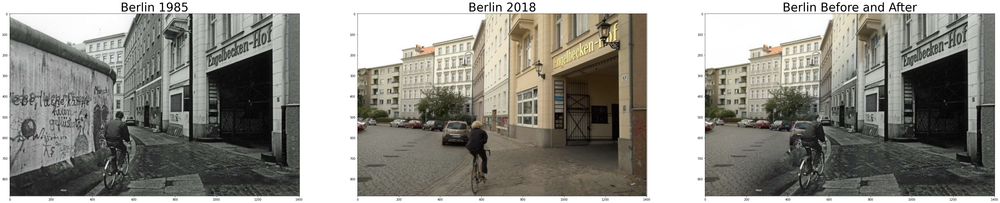

In [26]:
fig, ax = plt.subplots(1,3,figsize=(60, 30))
ax[0].imshow(image2)
ax[0].set_title('Berlin 1985',fontsize = 40)
ax[1].imshow(image1)
ax[1].set_title('Berlin 2018',fontsize = 40)
ax[2].imshow(laplacian_blend(image1,image2,mask))
ax[2].set_title('Berlin Before and After',fontsize = 40)

To show that our code can function for other image and mask combinations, we carried out another example from the same website as the Berlin biker to show the change in size of a glacier in the arctic over 103 years. The shoreline in the background do not perfectly line up, however you can still see the difference in glacier size produced over 100 years. The two images are resized to be the same size before being subjected to blending:

Text(0.5, 1.0, 'Arctic Over 103 Years')

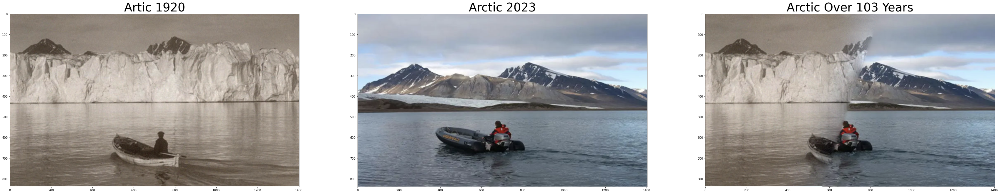

In [27]:
image3 = "before.jpg"
mask_fname = "split_mask.png"
image4 = "after.jpg"

image3 = cv2.cvtColor(cv2.imread(image3), cv2.COLOR_BGR2RGB)
image4 = cv2.cvtColor(cv2.imread(image4), cv2.COLOR_BGR2RGB)


image3, image4 = imresize(image3, image4)

mask2 = cv2.cvtColor(cv2.imread(mask_fname), cv2.COLOR_BGR2RGB)
articBlend = laplacian_blend(image3,image4,mask2)


fig, ax = plt.subplots(1,3,figsize=(60, 30))
ax[0].imshow(image3)
ax[0].set_title('Artic 1920',fontsize = 40)
ax[1].imshow(image4)
ax[1].set_title('Arctic 2023',fontsize = 40)
ax[2].imshow(articBlend)
ax[2].set_title('Arctic Over 103 Years',fontsize = 40)

## Hybrid Image

For our hybrid image creation we played around with a number of different images to try and overlay two different animals. First we tried overlaying a cat and a dog, however we continuously ran into issues aligning the eyes. This issue persisted for a number of animals including a cheetah and a lion, so we instead shifted to overylaying two images of a dog and a wolf running. This made it easier for us to center the images for the overlay to occur. This way we can kind of see a fun evolution from wolf to mans best friend as we use the visualizing laplacian blend to deconstruct the image at different sizes. Our code worked for all of the other combinations we tried, however we wanted to ensure a good quality image, as not all images can pair well together in the creation of a hybrid. For this code to run effectively you would simply need two grayscale images (if they are not grayscale you could use numpy and OpenCV to make it into grayscale) and our resize function to make the images the same size. The results are shown in the code blocks below starting with our results of implementing the hybrid function:

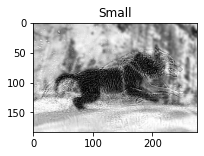

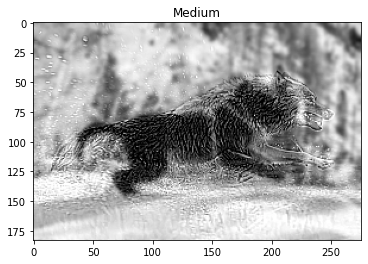

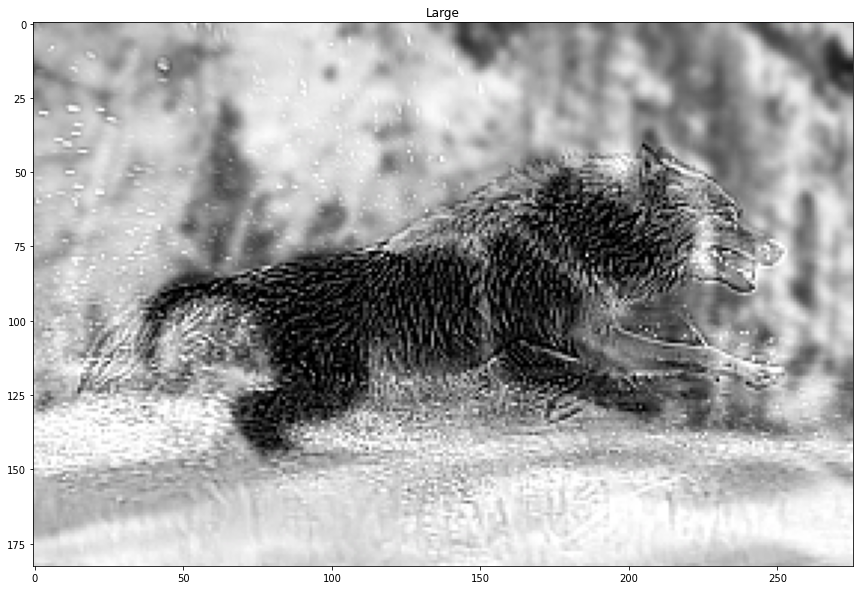

In [28]:
fig1 = plt.figure(figsize=(4, 2))
plt.imshow(wolfDog)
plt.title("Small")
plt.show()

fig2 = plt.figure(figsize=(8, 4))
plt.imshow(wolfDog)
plt.title("Medium")
plt.imshow

fig3 = plt.figure(figsize=(20, 10))
plt.imshow(wolfDog)
plt.title("Large")
plt.show()

We also used a laplacian pyramic blend to show the decomposition of the image to better see the breakdown as you decrease in size:

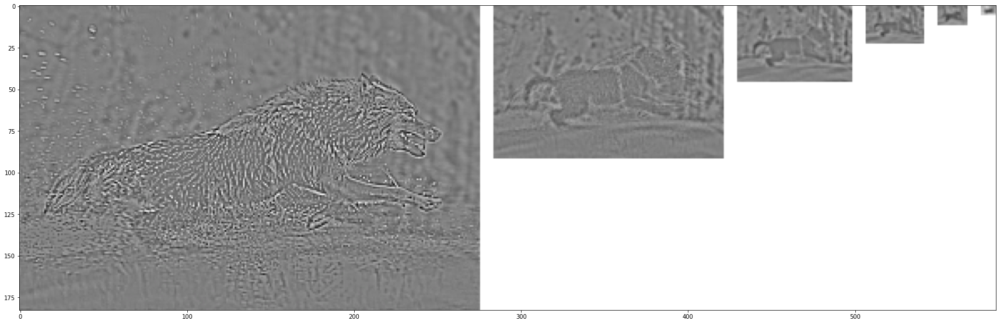

In [29]:
#laplacian pyramid of hybrid image
fig, ax = plt.subplots(figsize=(30, 10))
ax.imshow(visualize_pyramid(pyr_build(wolfDog)))

## Above and Beyond: Cropping with Facial Recognition:

Sometimes finding images of people that line up is difficult, and even when the faces do line up the pictures have to be similar in dimension for the hybrid image to turn out well. As seen below, the images have clear subjects and the faces are both square with the camera. But the images are different dimensions are the faces are not lined up in the same location relative to the camera. This causes a bad looking hybrid image to be created:


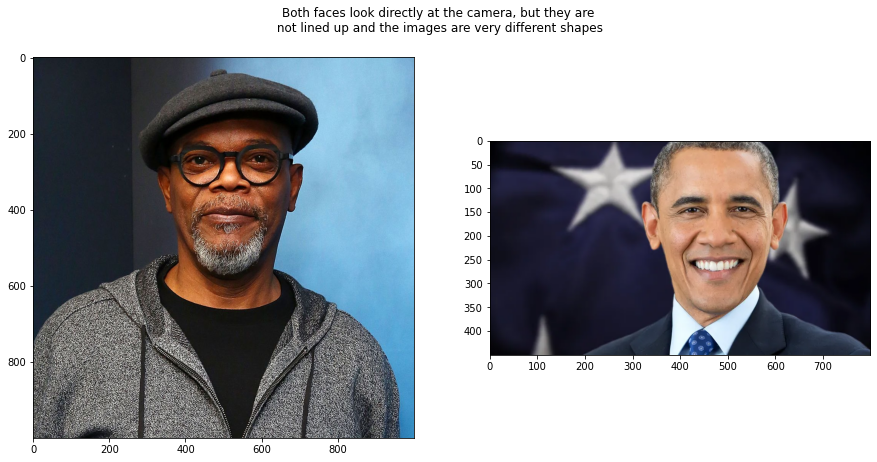

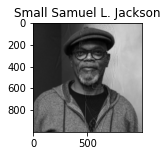

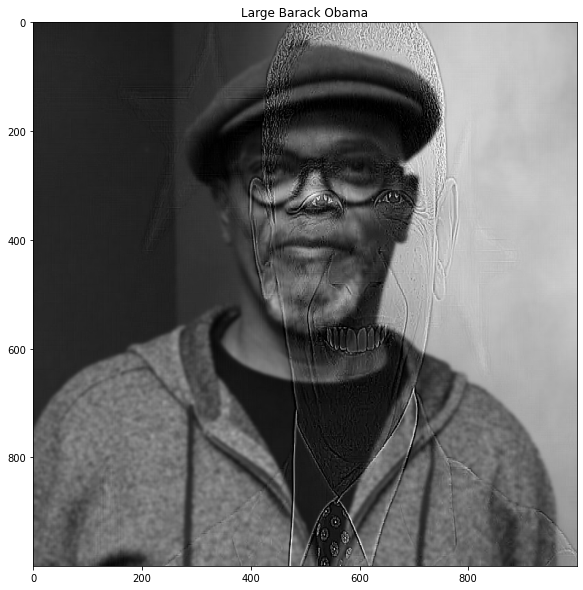

In [30]:
image5 = "samuel.jpg"
image6 = "obama.jpg"

image5 = cv2.cvtColor(cv2.imread(image5), cv2.COLOR_BGR2RGB)
image6 = cv2.cvtColor(cv2.imread(image6), cv2.COLOR_BGR2RGB)

r1, r2 = imresize(image5, image6)

### bad
bhybrid = cv2.cvtColor(hybrid_image(r1, r2,17, 7, 4.0), cv2.COLOR_BGR2GRAY)
bhybrid = cv2.cvtColor(bhybrid, cv2.COLOR_GRAY2BGR)

fig, ax = plt.subplots(1,2,figsize=(15, 7))
plt.suptitle("Both faces look directly at the camera, but they are\n not lined\
 up and the images are very different shapes");
ax[0].imshow(image5)
ax[1].imshow(image6)

fig = plt.figure(figsize=(4, 2))
plt.imshow(bhybrid)
plt.title("Small Samuel L. Jackson")
plt.show()

fig = plt.figure(figsize=(20, 10))
plt.imshow(bhybrid)
plt.title("Large Barack Obama")
plt.show()


So, for our "above and beyond factor" we adapted OpenCV facial detection code (https://towardsdatascience.com/face-detection-in-2-minutes-using-opencv-python-90f89d7c0f81) to create a function that automatically crops an image to the location of a face. With this function, the user now only has to choose pictures with faces in similar angles relative to the camera. The cropping lines up the faces for better hybrid image results.


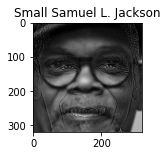

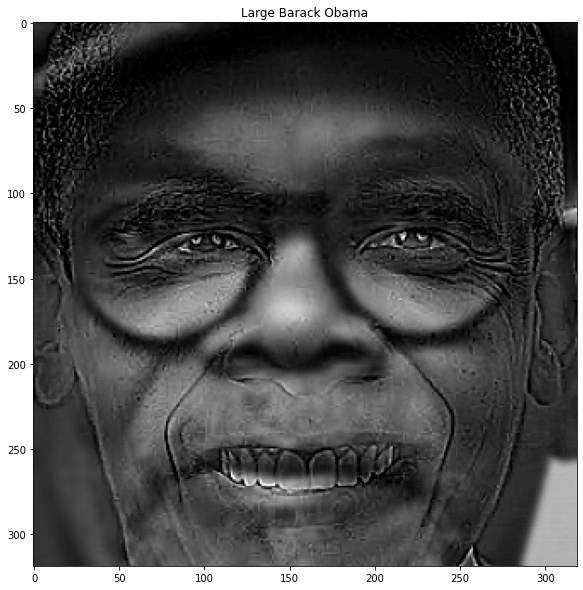

In [31]:
#crop to face and resize images
crop1, crop2 = facecrop(image5, image6)
crop1, crop2 = imresize(crop1, crop2)

#make hybrid
samobama = cv2.cvtColor(hybrid_image(crop1, crop2, 13, 5, 4.0), cv2.COLOR_GRAY2BGR)

### plot

fig = plt.figure(figsize=(4, 2))
plt.imshow(samobama)
plt.title("Small Samuel L. Jackson")
plt.show()

fig = plt.figure(figsize=(20, 10))
plt.imshow(samobama)
plt.title("Large Barack Obama")
plt.show()

###Save to local folder:

In [ ]:
### Write Resultant Photos to Directory
from google.colab import drive
drive.mount('/content/drive')

In [ ]:

## You will need to change this depending on 
image_dir = "/content/drive/MyDrive/CompVis/Project-2/output-images"
image1_path = image_dir + "/osteospermum.jpeg"
image2_path = image_dir + "/fruit_tray.jpeg"


cv2.imwrite(os.path.join(image_dir, 'BerlinBlend.jpg'), berlinBlend)
cv2.imwrite(os.path.join(image_dir, 'ArcticBlend.jpg'), articBlend)
cv2.imwrite(os.path.join(image_dir, 'DogWolfHybrid.jpg'), wolfDog)
cv2.imwrite(os.path.join(image_dir, 'ObamaJacksonHybrid.jpg'), samobama)
